In [0]:
#Importing Packages

from matplotlib import pyplot as plt
import networkx as nx
import random
import numpy as np
import itertools
import scipy

# Local Analysis

## Scenario 1: Both nodes have the same opinions on both topics.


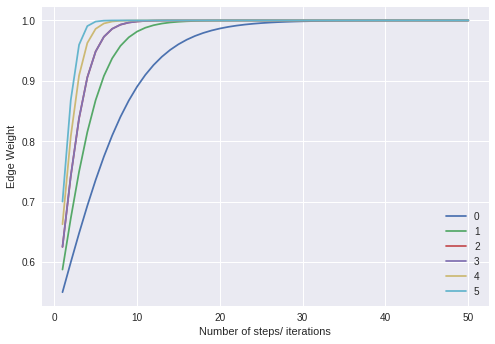

In [70]:
#Arranging the parameters in small, middle and large order
alphas = [0.03,0.08, 0.3]
betas = [0.2,0.5, 0.8]
gammas = [6,3, 2.25]

#Combinations - arranging the interaction between two small value nodes all the way up to two large value nodes
combos = [[0,0],[0,1],[0,2],[1,1],[1,2],[2,2]]

#Storing weights
weight_counter= []

for i in range(len(combos)): #Uses equations of the simulation
    
    weight_saver = []
    weight = 0.5
    opinions = [[1,1], [1,1]] #Topic 1, Topic 2
    
    for j in range(50): 

        topic = np.random.choice(np.arange(2)) #Randomly selecting topic

        opinions[topic][0] = opinions[topic][0] + alphas[combos[i][0]]  * weight * (opinions[topic][1] - opinions[topic][0])
        opinions[topic][1] = opinions[topic][1] + alphas[combos[i][1]]  * weight * (opinions[topic][0] - opinions[topic][1])

        weight = weight + np.mean([betas[combos[i][0]], betas[combos[i][1]]]) * weight * (1-weight) * (1 - np.mean([gammas[combos[i][0]], gammas[combos[i][1]]]) * abs(opinions[topic][0] - opinions[topic][1]))
            
        weight_saver.append(weight)
    weight_counter.append(weight_saver) #Storing weights for each combination

#Plotting graph

for i in range(6):
    plt.plot(np.linspace(1,50,num=50),weight_counter[i], label= i)

plt.xlabel('Number of steps/ iterations')
plt.ylabel('Edge Weight')
plt.legend()

## Scenario 2: Both nodes have opposing opinions on both topics.


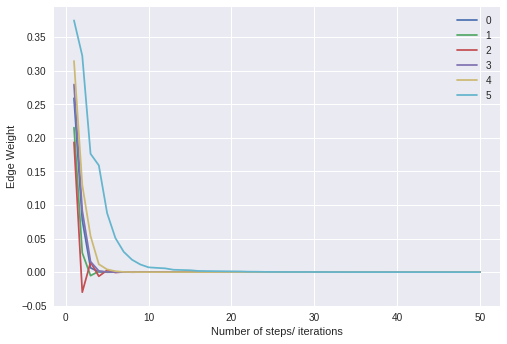

In [71]:
#Arranging the parameters in small, middle and large order
alphas = [0.03,0.08, 0.3]
betas = [0.2,0.5, 0.8]
gammas = [6,3, 2.25]

#Combinations - arranging the interaction between two small value nodes all the way up to two large value nodes
combos = [[0,0],[0,1],[0,2],[1,1],[1,2],[2,2]]

#Storing weights
weight_counter= []

for i in range(len(combos)): #Uses equations of the simulation
    
    weight_saver = []
    weight = 0.5
    opinions = [[0,1], [1,0]] #Topic 1, Topic 2
    
    for j in range(50): 

        topic = np.random.choice(np.arange(2)) #Randomly selecting topic

        opinions[topic][0] = opinions[topic][0] + alphas[combos[i][0]]  * weight * (opinions[topic][1] - opinions[topic][0])
        opinions[topic][1] = opinions[topic][1] + alphas[combos[i][1]]  * weight * (opinions[topic][0] - opinions[topic][1])

        weight = weight + np.mean([betas[combos[i][0]], betas[combos[i][1]]]) * weight * (1-weight) * (1 - np.mean([gammas[combos[i][0]], gammas[combos[i][1]]]) * abs(opinions[topic][0] - opinions[topic][1]))
            
        weight_saver.append(weight)
    weight_counter.append(weight_saver) #Storing weights for each combination

#Plotting graph

for i in range(6):
    plt.plot(np.linspace(1,50,num=50),weight_counter[i], label= i)

plt.xlabel('Number of steps/ iterations')
plt.ylabel('Edge Weight')
plt.legend()

## Scenario 3: Nodes have similar opinions on one topic and opposing opinions on the other topic.


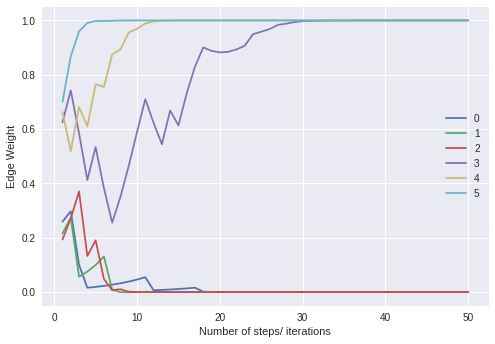

In [78]:
#Arranging the parameters in small, middle and large order
alphas = [0.03,0.08, 0.3]
betas = [0.2,0.5, 0.8]
gammas = [6,3, 2.25]

#Combinations - arranging the interaction between two small value nodes all the way up to two large value nodes
combos = [[0,0],[0,1],[0,2],[1,1],[1,2],[2,2]]

#Storing weights
weight_counter= []

for i in range(len(combos)): #Uses equations of the simulation
    
    weight_saver = []
    weight = 0.5
    opinions = [[1,1], [1,0]] #Topic 1, Topic 2
    
    for j in range(50): 

        topic = np.random.choice(np.arange(2)) #Randomly selecting topic

        opinions[topic][0] = opinions[topic][0] + alphas[combos[i][0]]  * weight * (opinions[topic][1] - opinions[topic][0])
        opinions[topic][1] = opinions[topic][1] + alphas[combos[i][1]]  * weight * (opinions[topic][0] - opinions[topic][1])

        weight = weight + np.mean([betas[combos[i][0]], betas[combos[i][1]]]) * weight * (1-weight) * (1 - np.mean([gammas[combos[i][0]], gammas[combos[i][1]]]) * abs(opinions[topic][0] - opinions[topic][1]))
            
        weight_saver.append(weight)
    weight_counter.append(weight_saver) #Storing weights for each combination

#Plotting graph

for i in range(6):
    plt.plot(np.linspace(1,50,num=50),weight_counter[i], label= i)

plt.xlabel('Number of steps/ iterations')
plt.ylabel('Edge Weight')
plt.legend()

# Simulation Using Parameter Values Randomly Drawn from Distribution


In [0]:
class SocialDynamicsSimulation_modified:
    '''
    Simulate social dynamics by strengthening opinions and connection weights
    based on random interactions between nodes.
    
    Modifications from original model: each node has opinions on two topics intead of one, 
    changing the rules to form a new relationship and adding personalized parameters for each node in the network.
    '''

    def __init__(self, network_size=50, num_topics = 2):
        '''
        Inputs:

            network_size (int) The number of nodes in the random Watts-Strogatz
              small-world network. Default: 50.
              
            num_topics (int) The number of topics each node can have an opinion
            about. Default: 2.
            
        '''
        self.network_size = network_size
        self.num_topics = num_topics

    def initialize(self):
        '''
        
        Initialize the simulation with a random graph, with random 0 or 1
        opinions for each topic assigned to all nodes, initial edge weights of 0.5,
        and personalised alpha, beta and gamma parameters, drawn from different 
        uniform distribution with set constraints for each parameter.
        
        '''
        self.graph = nx.barabasi_albert_graph(self.network_size, 5)
        for edge in self.graph.edges:
            self.graph.edges[edge]['weight'] = 0.5
        for node in self.graph.nodes:
            self.graph.nodes[node]['opinion'] = [random.randint(0, 1) for _ in range(self.num_topics)]
        for node in self.graph.nodes:
            self.graph.nodes[node]['alpha'] = random.uniform(0.01,0.5)
        for node in self.graph.nodes:
            self.graph.nodes[node]['beta'] = random.uniform(0.01,1)
        for node in self.graph.nodes:
            self.graph.nodes[node]['gamma'] = random.uniform(0.1,1+(1/self.graph.nodes[node]['beta']))
        self.layout = nx.spring_layout(self.graph)  # Initial visual layout
        self.step = 0

    def observe(self): 
        '''
        Draw the state of the network. Node colour shows the opinions for topic 1,
        node size shows the opinions for topic 2.
        
        '''
        self.layout = nx.spring_layout(self.graph, pos = self.layout, iterations=5)
        plt.clf()
        nx.draw(
            self.graph, pos=self.layout, with_labels=True,
            node_color=[self.graph.nodes[i]['opinion'][0] for i in self.graph.nodes], 
            node_size=[self.graph.nodes[i]['opinion'][1] * 1000 for i in self.graph.nodes],
            edge_color=[self.graph.edges[i, j]['weight'] for i, j in self.graph.edges],
            cmap = plt.cm.RdYlGn, edge_cmap=plt.cm.binary, edge_vmin=0, edge_vmax=1,
            alpha=0.7, vmin=0, vmax=1)
        plt.title('Step: ' + str(self.step))
        

    def update(self): 
        
        if random.uniform(0, 1) < 0.01:
            
            # Create a new edge with weight 0.2 between two unconnected nodes
            # Models randomly meeting someone new that is not a friend of a friend.
            
            nodes = list(self.graph.nodes)
            while True:
                new_edge = random.sample(nodes, 2)
                if new_edge not in self.graph.edges:
                    break
            self.graph.add_edge(new_edge[0], new_edge[1], weight=0.2)
            
        elif random.uniform(0, 1) < 0.05: 
            
            # Create a new edge between two unconnected nodes
            # Weight based on number of mutual connections
            # Models meeting friends of your friends
            # Higher chance of meeting someone new this way than randomly meeting someone 
            
            nodes = list(self.graph.nodes)
            while True:
                new_edge = random.sample(nodes, 2)
                if new_edge not in self.graph.edges:
                    if len(set(self.graph[new_edge[1]]).intersection(self.graph[new_edge[0]])) >= 1:
                        break
            self.graph.add_edge(new_edge[0], new_edge[1], 
            weight = min((0.1+ 0.1* len(set(self.graph[new_edge[1]]).intersection(self.graph[new_edge[0]]))), 0.5))
            
        else:
            # Select a random edge and update node opinions and edge weight
            # This takes into account individual alpha, beta and gamma values
            # Topic to be 'discussed' is randomly chosen
            
            edge = random.choice(list(self.graph.edges))
            weight = self.graph.edges[edge]['weight']
            opinions = [self.graph.nodes[n]['opinion'] for n in edge]
            node_alphas = [self.graph.nodes[n]['alpha'] for n in edge]
            node_betas = [self.graph.nodes[n]['beta'] for n in edge]
            node_gammas = [self.graph.nodes[n]['gamma'] for n in edge]
            topic = np.random.choice(np.arange(self.num_topics))
            
            for i in [0, 1]:
                self.graph.nodes[edge[i]]['opinion'][topic] = (
                    opinions[topic][i] + node_alphas[i]  * weight * (opinions[topic][1-i] - opinions[topic][i]))
            self.graph.edges[edge]['weight'] = (
                weight +
                np.mean(node_betas) * weight * (1-weight) *
                (1 - np.mean(node_gammas) * abs(opinions[topic][0] - opinions[topic][1])))
            # Remove very weak connections
            if self.graph.edges[edge]['weight'] < 0.05:
                self.graph.remove_edge(*edge)
        self.step += 1

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


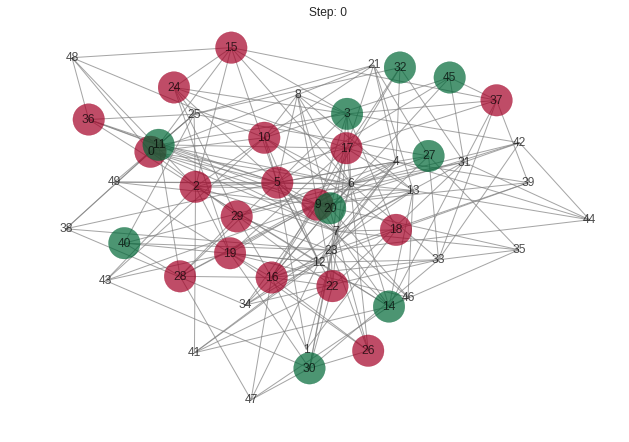

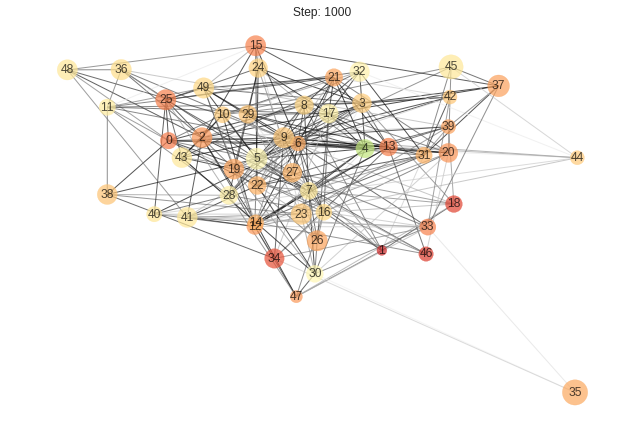

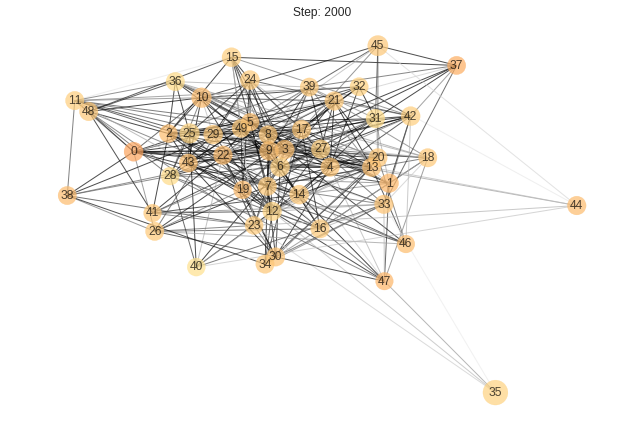

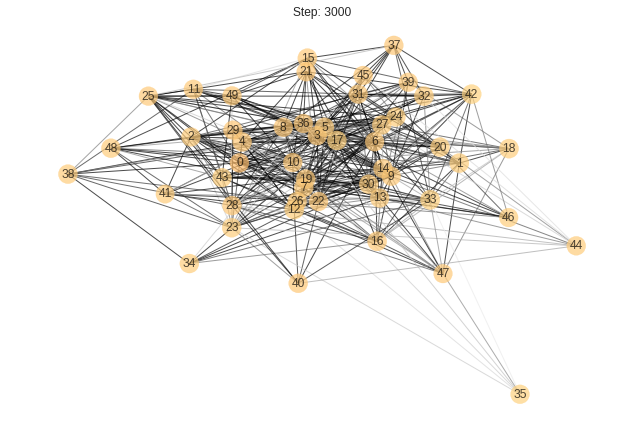

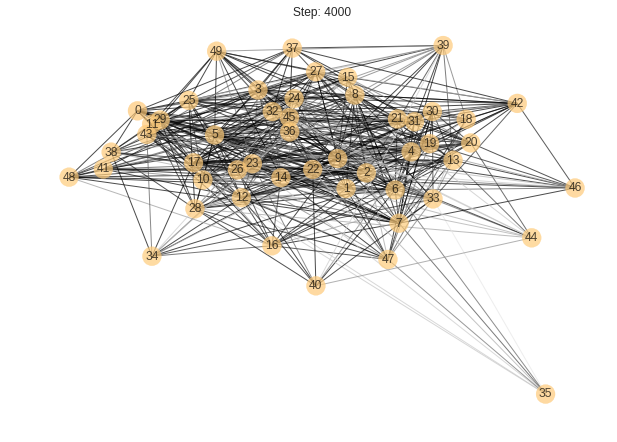

...

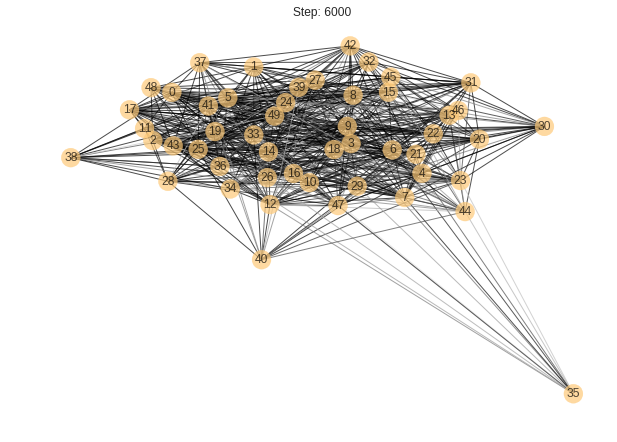

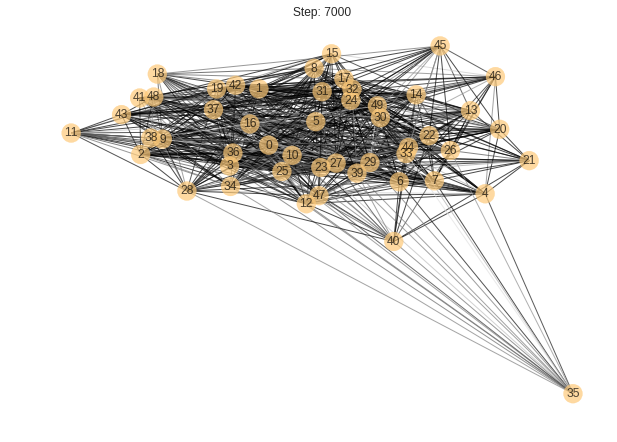

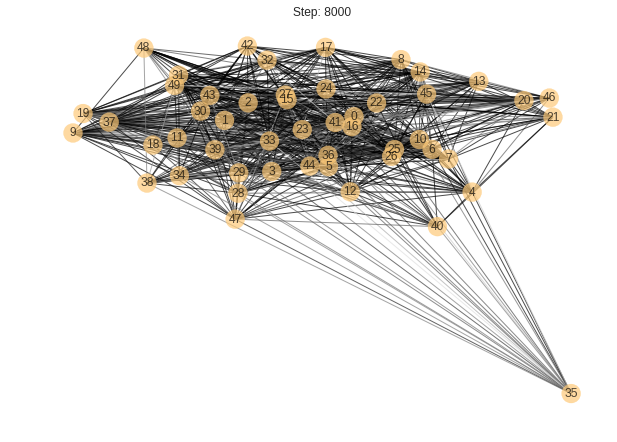

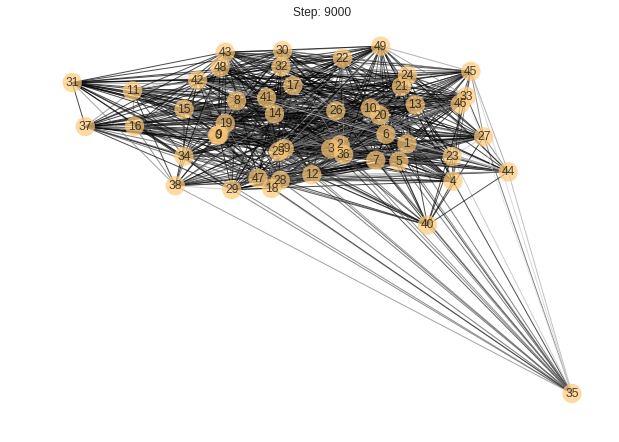

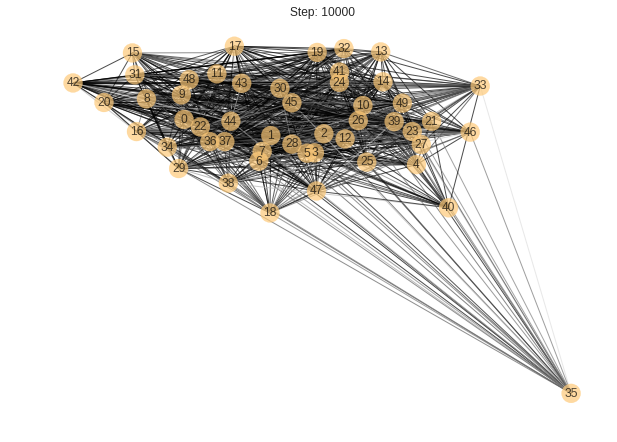

In [50]:
#Showing how network changes

sim = SocialDynamicsSimulation_modified()
sim.initialize()
plt.figure()
sim.observe()
for i in range(10):
    for i in range(1000):
        sim.update()
    plt.figure()
    sim.observe()

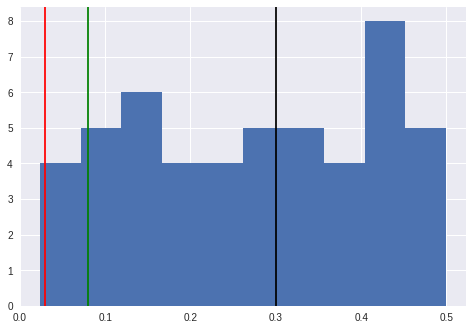

In [51]:
#Plotting alpha distribution based on samples

alpha_list = nx.get_node_attributes(sim.graph, 'alpha')
plt.hist(alpha_list.values())
plt.axvline(0.03, color = 'r')
plt.axvline(0.08, color = 'g')
plt.axvline(0.3, color = 'black')

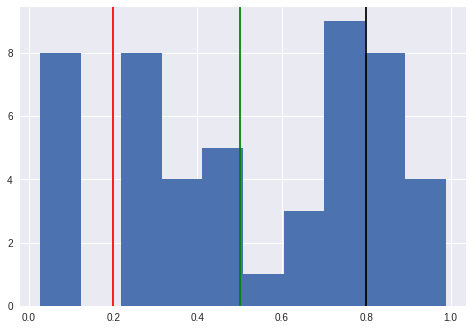

In [52]:
#Plotting beta distribution based on samples

beta_list = nx.get_node_attributes(sim.graph, 'beta')
plt.hist(beta_list.values())
plt.axvline(0.2, color = 'r')
plt.axvline(0.5, color = 'g')
plt.axvline(0.8, color = 'black')

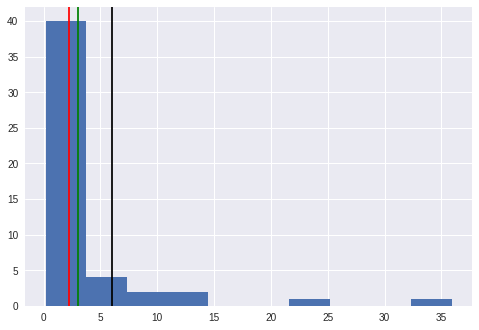

In [53]:
#Plotting gamma distribution based on samples

gamma_list = nx.get_node_attributes(sim.graph, 'gamma')
plt.hist(gamma_list.values())
plt.axvline(2.25, color = 'r')
plt.axvline(3, color = 'g')
plt.axvline(6, color = 'black')

In [0]:
class SocialDynamicsSimulation_simulations:
    '''
    Simulate social dynamics by strengthening opinions and connection weights
    based on random interactions between nodes.
    
    Modifications from original model: each node has opinions on two topics intead of one, 
    changing the rules to form a new relationship and adding personalized parameters for each node in the network.
    '''

    def __init__(self, network_size=50, num_topics = 2, alpha_LB = 0.5,alpha_UB = 0.5, beta_LB = 0.5,beta_UB = 0.5,gamma_LB = 0.5,gamma_UB = 0.5):
        '''
        Inputs:

            network_size (int) The number of nodes in the random Watts-Strogatz
              small-world network. Default: 50.
              
            num_topics (int) The number of topics each node can have an opinion
            about. Default: 2.
            
        '''
        
        self.network_size = network_size
        self.num_topics = num_topics
        self.alpha_LB = alpha_LB
        self.alpha_UB = alpha_UB
        self.beta_LB = beta_LB
        self.beta_UB = beta_UB
        self.gamma_LB = gamma_LB
        self.gamma_UB = gamma_UB

    def initialize(self):
        '''
        
        Initialize the simulation with a random graph, with random 0 or 1
        opinions for each topic assigned to all nodes, initial edge weights of 0.5,
        and personalised alpha, beta and gamma parameters, drawn from different 
        uniform distribution with set constraints for each parameter.
        
        '''
#         self.graph = nx.watts_strogatz_graph(self.network_size, 5, 0.5)
        self.graph = nx.barabasi_albert_graph(self.network_size, 5)
        for edge in self.graph.edges:
            self.graph.edges[edge]['weight'] = 0.5
        for node in self.graph.nodes:
            self.graph.nodes[node]['opinion'] = [random.randint(0, 1) for _ in range(self.num_topics)]
        for node in self.graph.nodes:
            self.graph.nodes[node]['alpha'] = random.choice([self.alpha_LB,self.alpha_UB])
        for node in self.graph.nodes:
            self.graph.nodes[node]['beta'] = random.choice([self.beta_LB,self.beta_UB])
        for node in self.graph.nodes:
            self.graph.nodes[node]['gamma'] = random.choice([self.gamma_LB,self.gamma_UB])
        self.layout = nx.spring_layout(self.graph)  # Initial visual layout
        self.step = 0

    def observe(self): 
        '''
        Draw the state of the network. Node colour shows the opinions for topic 1,
        node size shows the opinions for topic 2.
        
        '''
        self.layout = nx.spring_layout(self.graph, pos = self.layout, iterations=5)
        plt.clf()
        nx.draw(
            self.graph, pos=self.layout, with_labels=True,
            node_color=[self.graph.nodes[i]['opinion'][0] for i in self.graph.nodes], 
            node_size=[self.graph.nodes[i]['opinion'][1] * 1000 for i in self.graph.nodes],
            edge_color=[self.graph.edges[i, j]['weight'] for i, j in self.graph.edges],
            cmap = plt.cm.RdYlGn, edge_cmap=plt.cm.binary, edge_vmin=0, edge_vmax=1,
            alpha=0.7, vmin=0, vmax=1)
        plt.title('Step: ' + str(self.step))
        

    def update(self): 
        
        if random.uniform(0, 1) < 0.01:
            
            # Create a new edge with weight 0.2 between two unconnected nodes
            # Models randomly meeting someone new that is not a friend of a friend.
            
            nodes = list(self.graph.nodes)
            while True:
                new_edge = random.sample(nodes, 2)
                if new_edge not in self.graph.edges:
                    break
            self.graph.add_edge(new_edge[0], new_edge[1], weight=0.2)
            
        elif random.uniform(0, 1) < 0.05: 
            
            # Create a new edge between two unconnected nodes
            # Weight based on number of mutual connections
            # Models meeting friends of your friends
            # Higher chance of meeting someone new this way than randomly meeting someone 
            
            nodes = list(self.graph.nodes)
            while True:
                new_edge = random.sample(nodes, 2)
                if new_edge not in self.graph.edges:
                    if len(set(self.graph[new_edge[1]]).intersection(self.graph[new_edge[0]])) >= 1:
                        break
            self.graph.add_edge(new_edge[0], new_edge[1], 
            weight = min((0.1+ 0.1* len(set(self.graph[new_edge[1]]).intersection(self.graph[new_edge[0]]))), 0.5))
            
        else:
            # Select a random edge and update node opinions and edge weight
            # This takes into account individual alpha, beta and gamma values
            # Topic to be 'discussed' is randomly chosen
            
            edge = random.choice(list(self.graph.edges))
            weight = self.graph.edges[edge]['weight']
            opinions = [self.graph.nodes[n]['opinion'] for n in edge]
            node_alphas = [self.graph.nodes[n]['alpha'] for n in edge]
            node_betas = [self.graph.nodes[n]['beta'] for n in edge]
            node_gammas = [self.graph.nodes[n]['gamma'] for n in edge]
            topic = np.random.choice(np.arange(self.num_topics))
            
            for i in [0, 1]:
                self.graph.nodes[edge[i]]['opinion'][topic] = (
                    opinions[topic][i] + node_alphas[i]  * weight * (opinions[topic][1-i] - opinions[topic][i]))
            self.graph.edges[edge]['weight'] = (
                weight +
                np.mean(node_betas) * weight * (1-weight) *
                (1 - np.mean(node_gammas) * abs(opinions[topic][0] - opinions[topic][1])))
            # Remove very weak connections
            if self.graph.edges[edge]['weight'] < 0.05:
                self.graph.remove_edge(*edge)
        self.step += 1

## Simulation Using Small Parameter Values 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


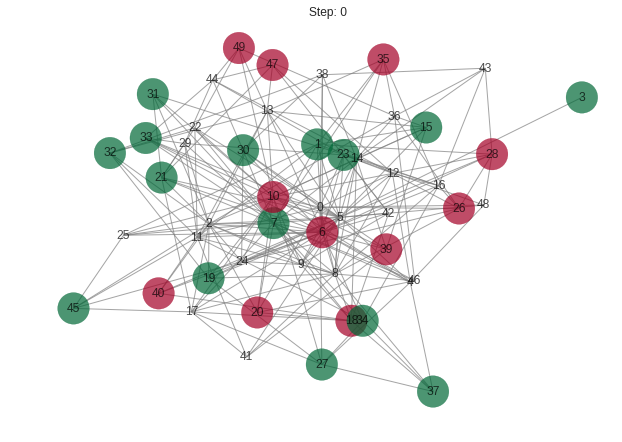

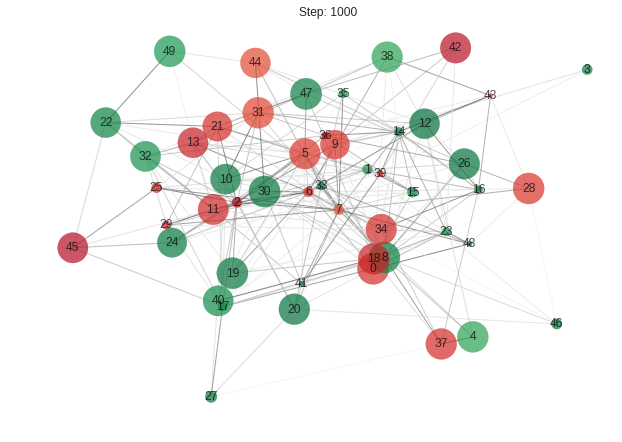

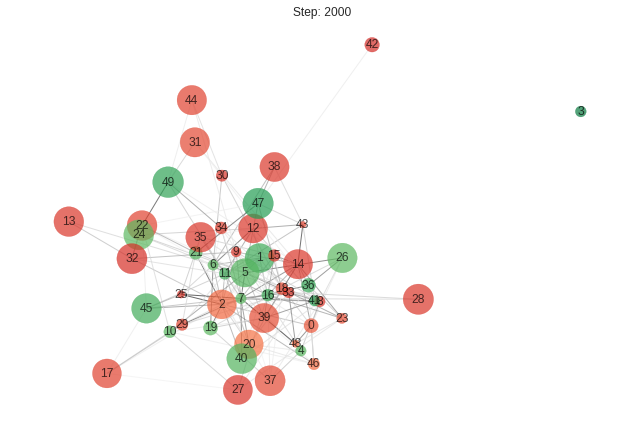

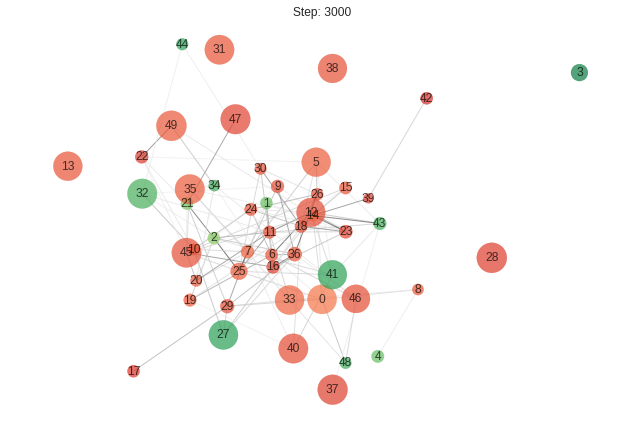

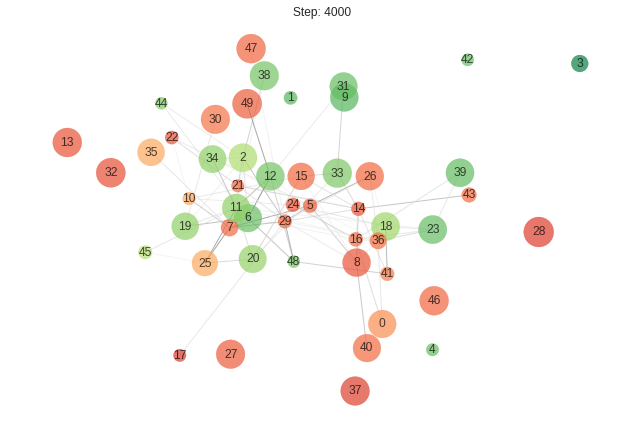

...

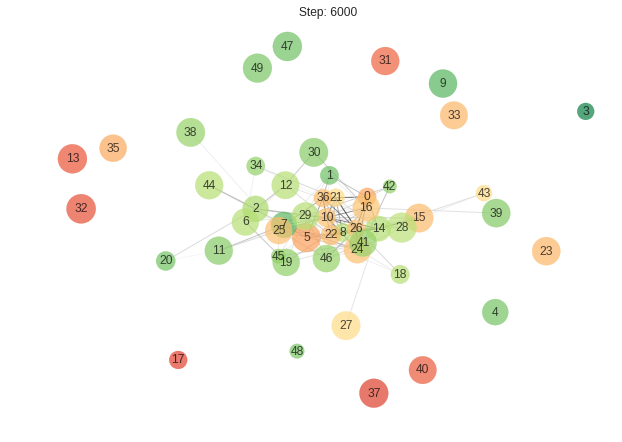

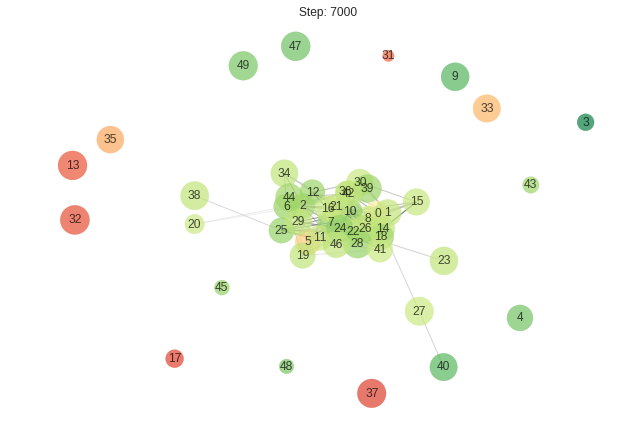

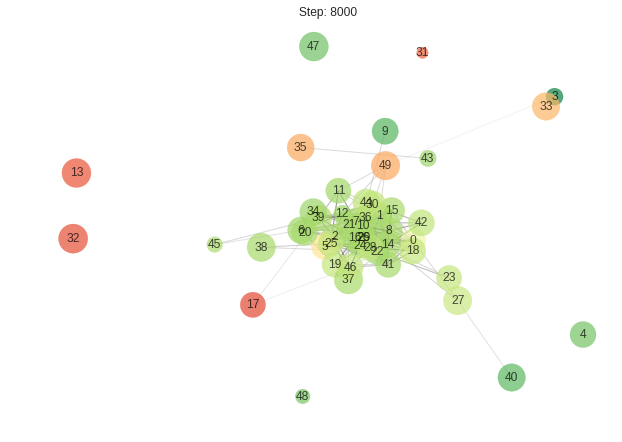

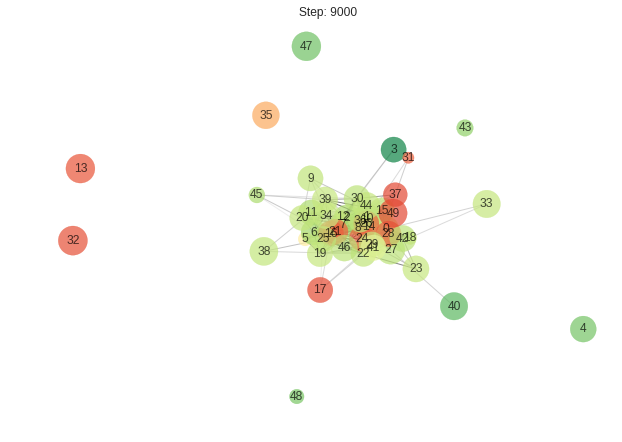

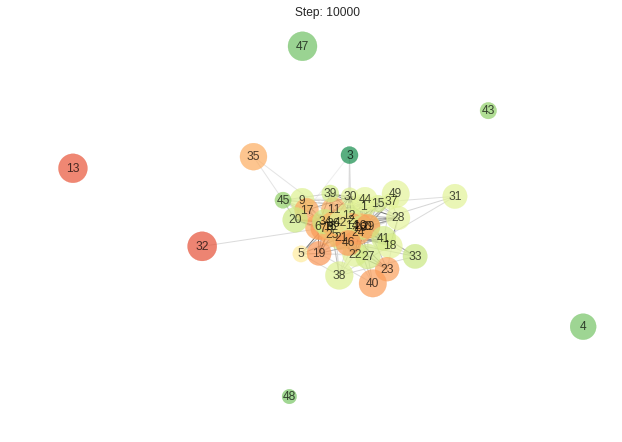

In [63]:
sim = SocialDynamicsSimulation_simulations(alpha_LB = 0.03,alpha_UB = 0.03, beta_LB = 0.2,beta_UB = 0.2,gamma_LB = 6,gamma_UB = 6)
sim.initialize()
plt.figure()
sim.observe()
for i in range(10):
    for i in range(1000):
        sim.update()
    plt.figure()
    sim.observe()

## Simulation Using Small and Medium Parameter Values 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


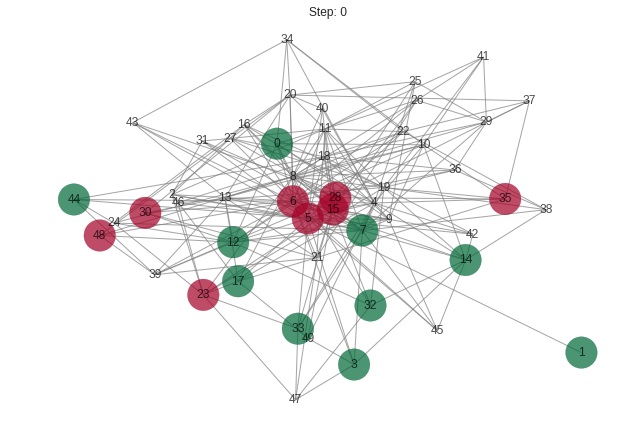

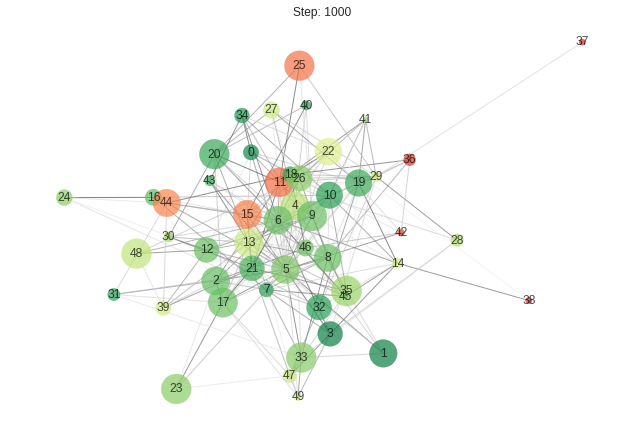

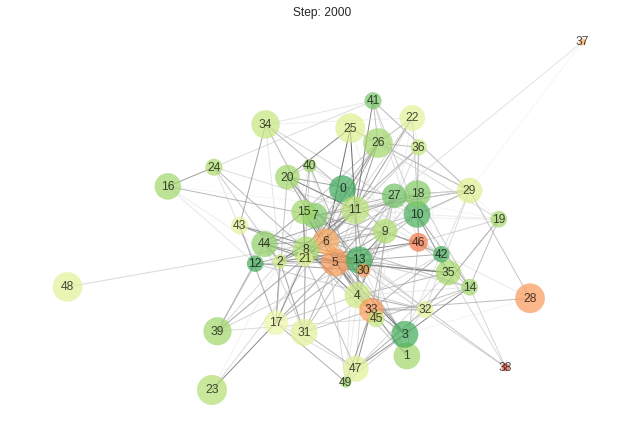

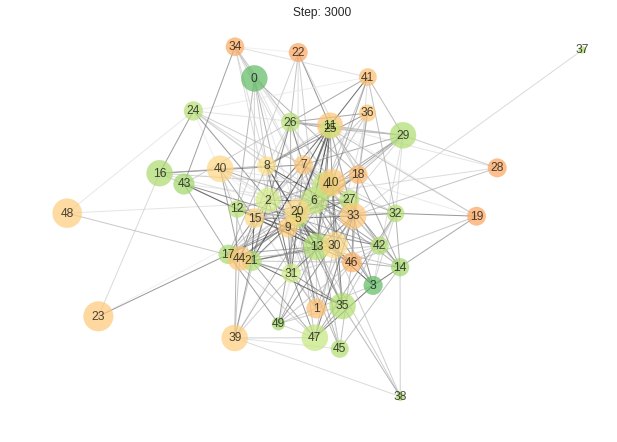

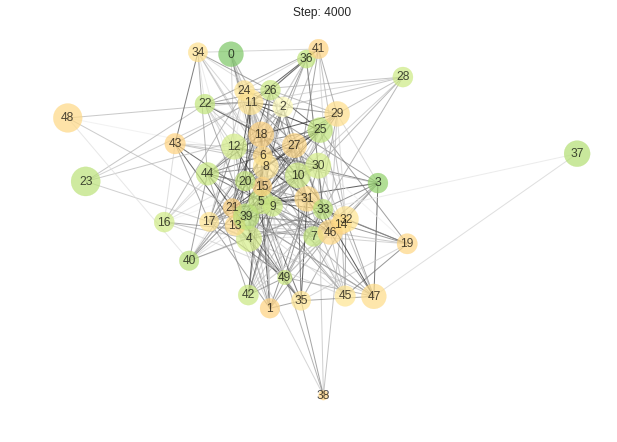

...

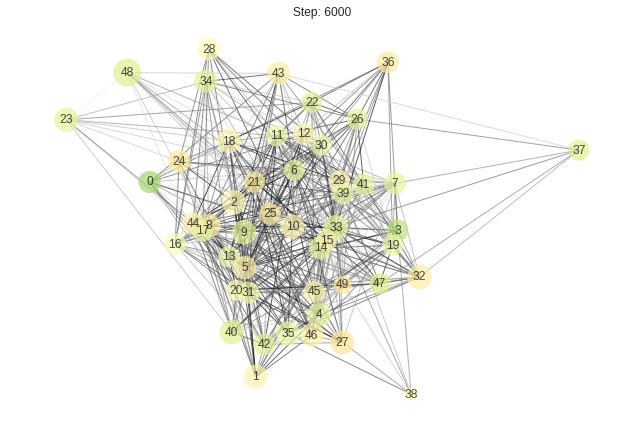

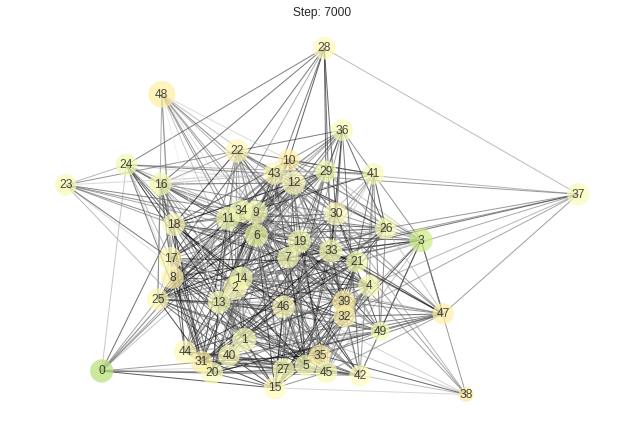

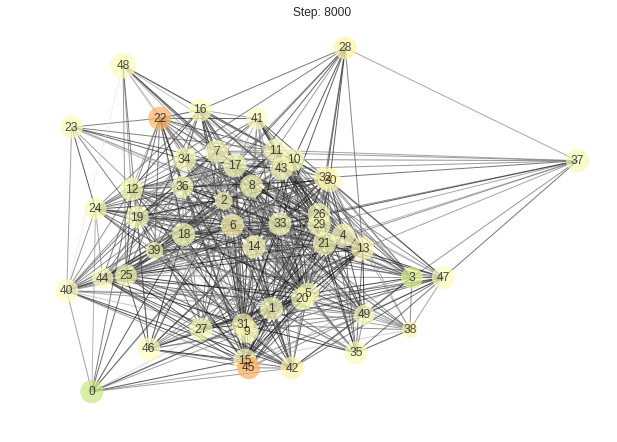

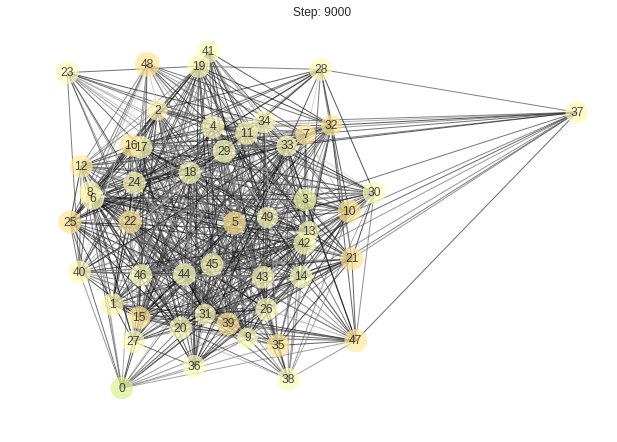

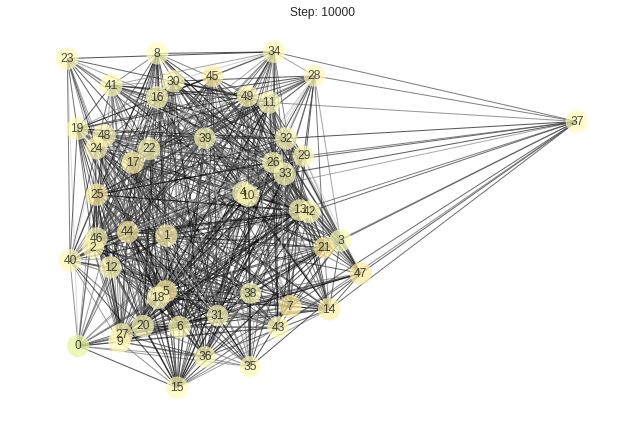

In [64]:
sim = SocialDynamicsSimulation_simulations(alpha_LB = 0.03,alpha_UB = 0.08, beta_LB = 0.2,beta_UB = 0.5,gamma_LB = 3,gamma_UB = 6)
sim.initialize()
plt.figure()
sim.observe()
for i in range(10):
    for i in range(1000):
        sim.update()
    plt.figure()
    sim.observe()

## Simulation Using Small and Large Parameter Values 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


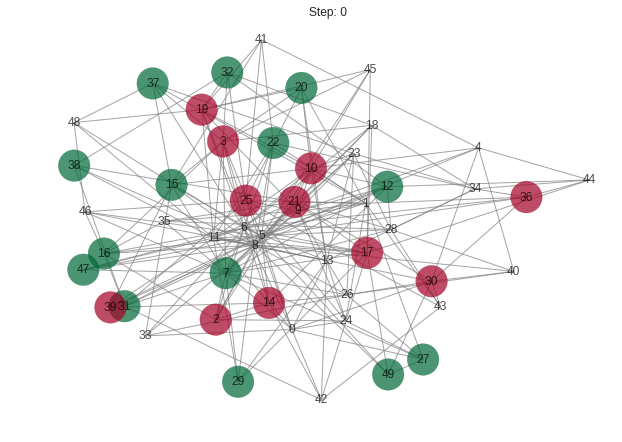

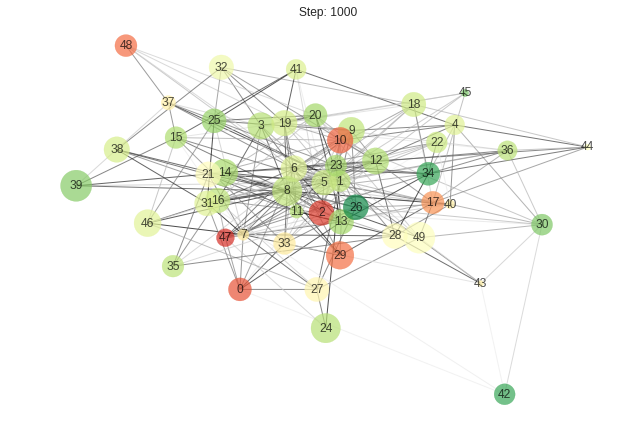

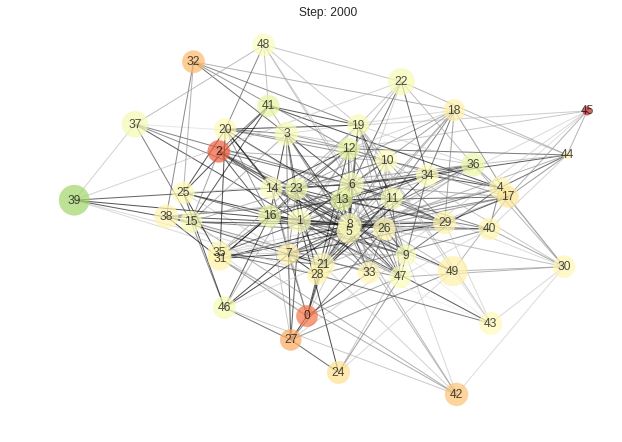

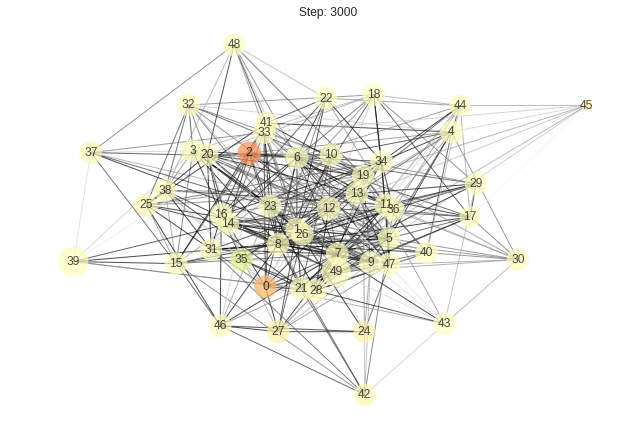

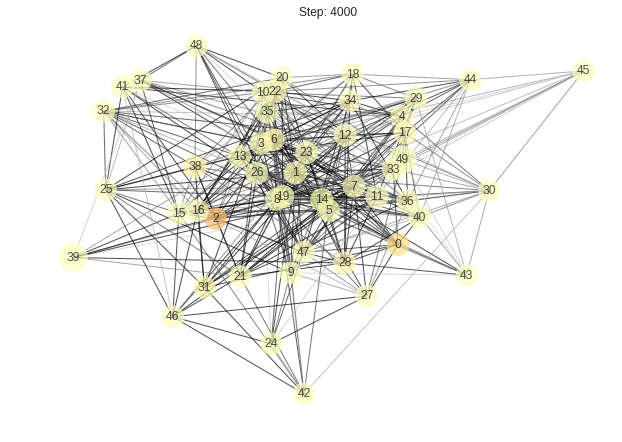

...

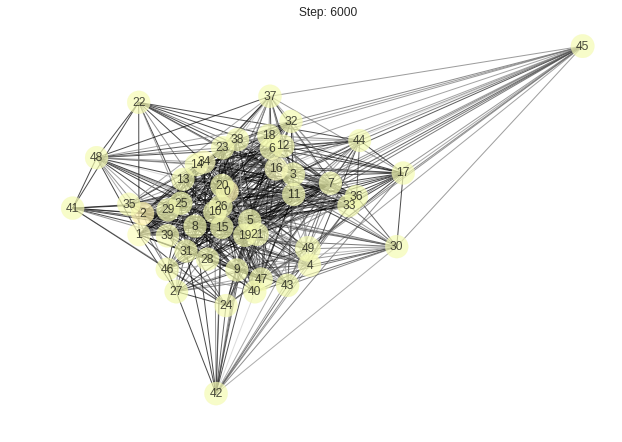

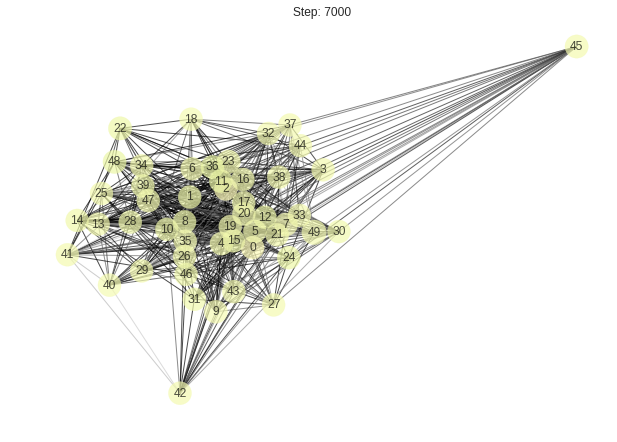

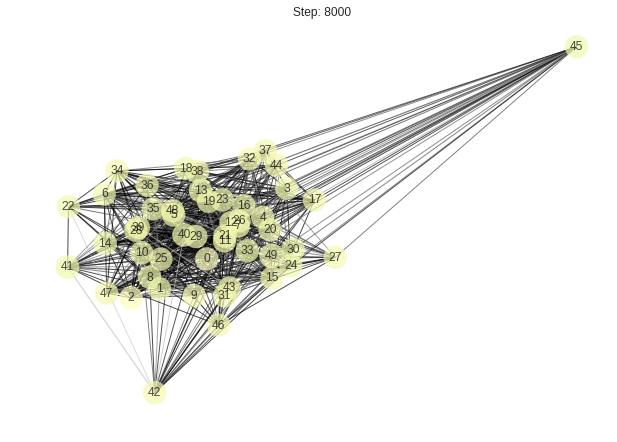

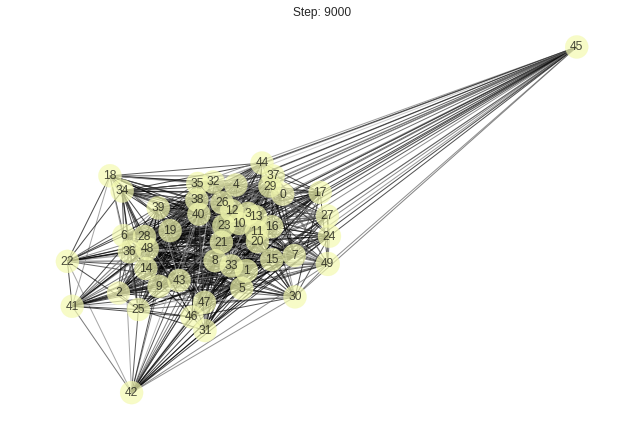

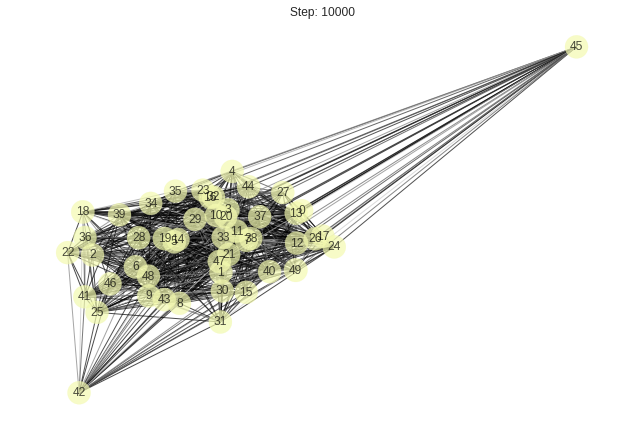

In [65]:
sim = SocialDynamicsSimulation_simulations(alpha_LB = 0.03,alpha_UB = 0.3, beta_LB = 0.2,beta_UB = 0.8,gamma_LB = 2.25,gamma_UB = 6)
sim.initialize()
plt.figure()
sim.observe()
for i in range(10):
    for i in range(1000):
        sim.update()
    plt.figure()
    sim.observe()

## Simulation Using Medium Parameter Values 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


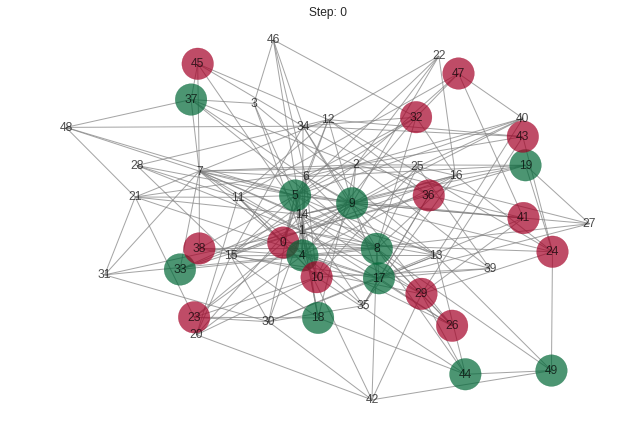

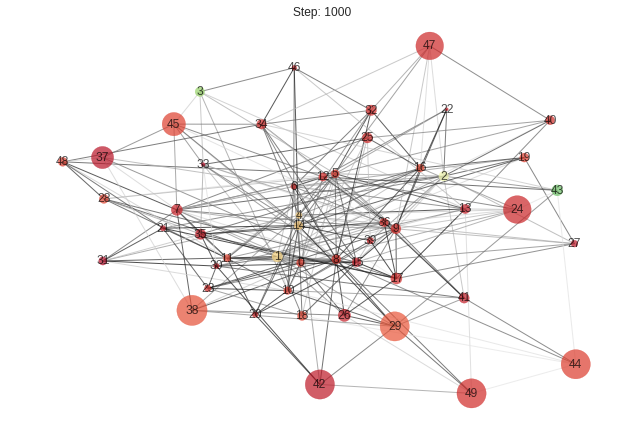

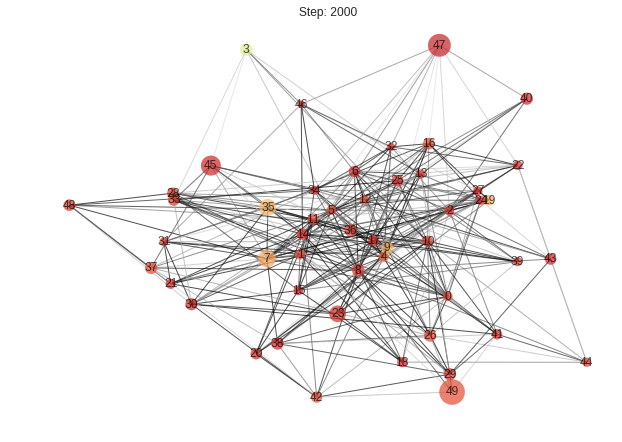

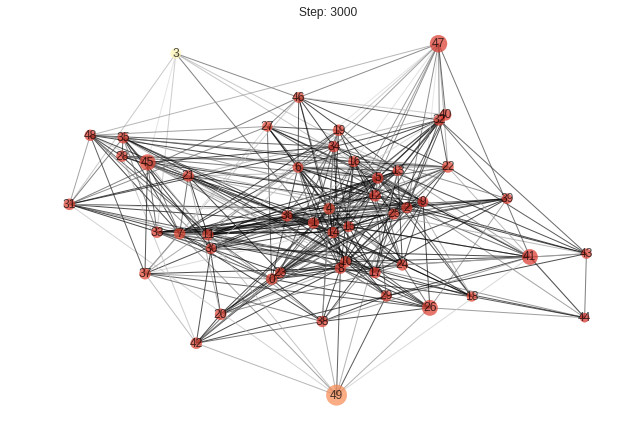

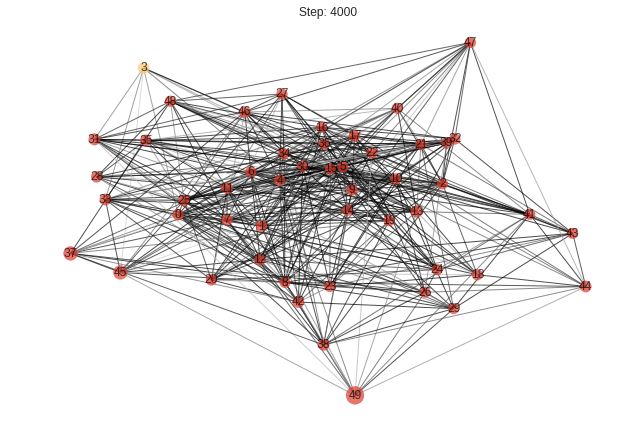

...

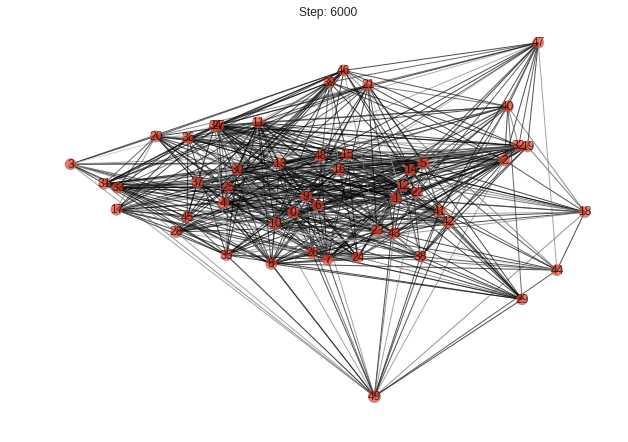

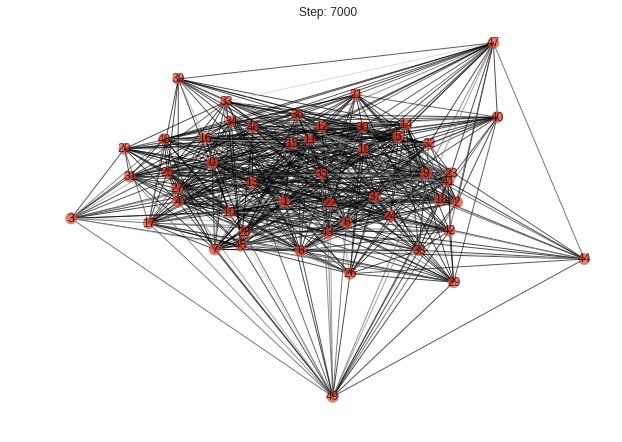

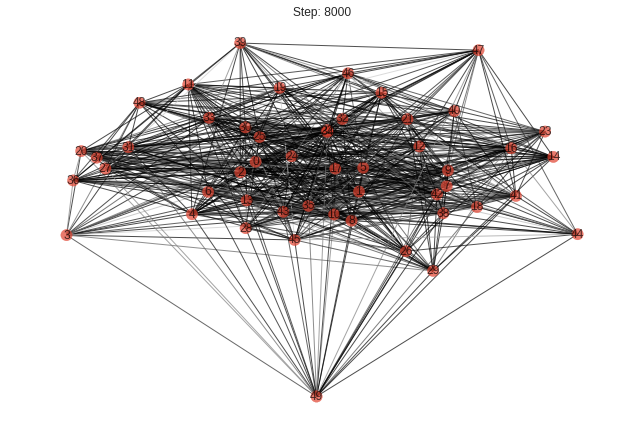

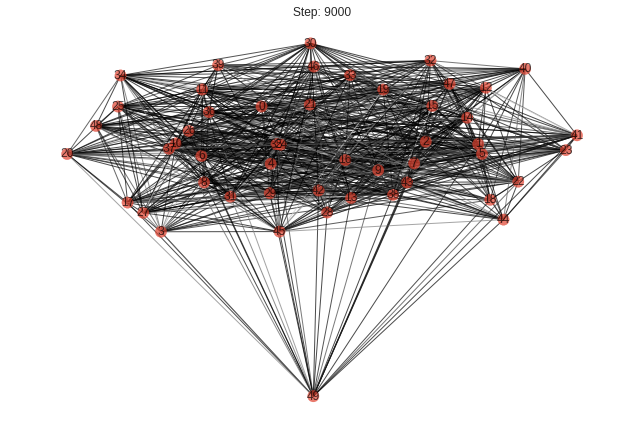

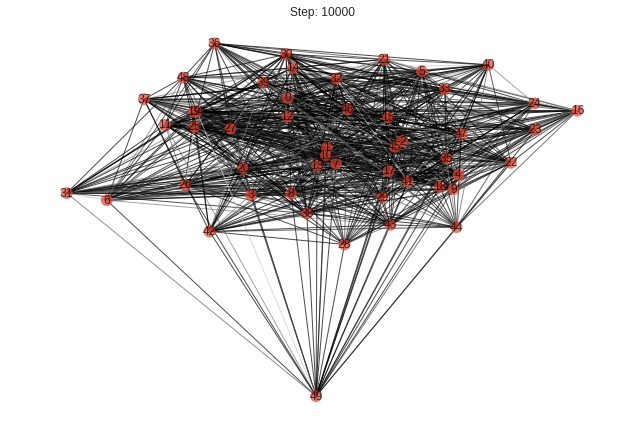

In [66]:
sim = SocialDynamicsSimulation_simulations(alpha_LB = 0.08,alpha_UB = 0.08, beta_LB = 0.5,beta_UB = 0.5,gamma_LB = 3,gamma_UB = 3)
sim.initialize()
plt.figure()
sim.observe()
for i in range(10):
    for i in range(1000):
        sim.update()
    plt.figure()
    sim.observe()

## Simulation Using Medium and Large Parameter Values 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


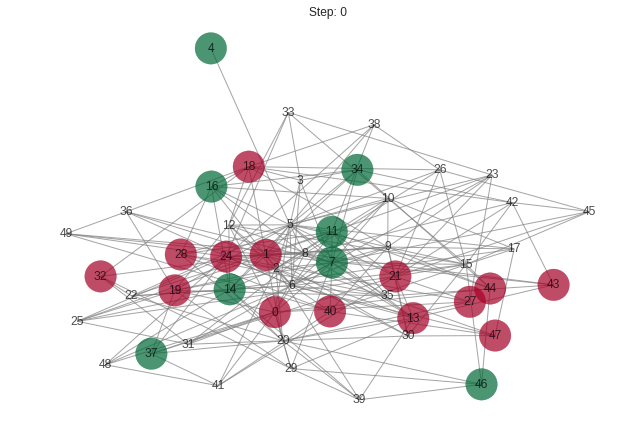

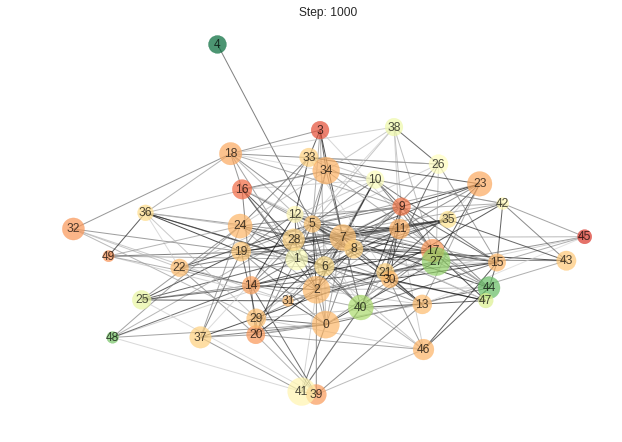

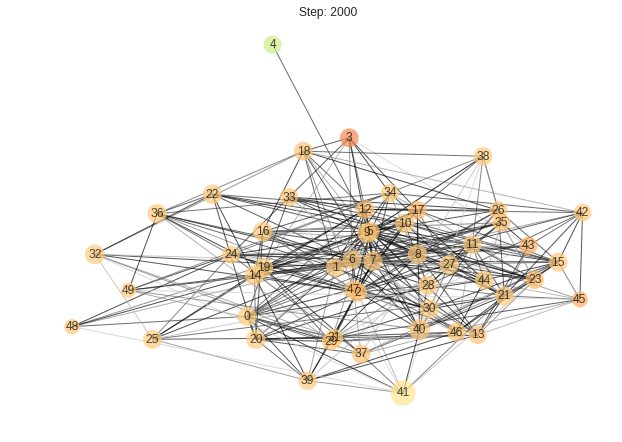

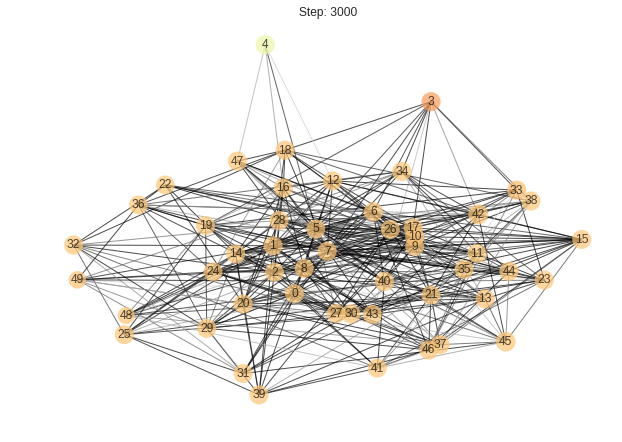

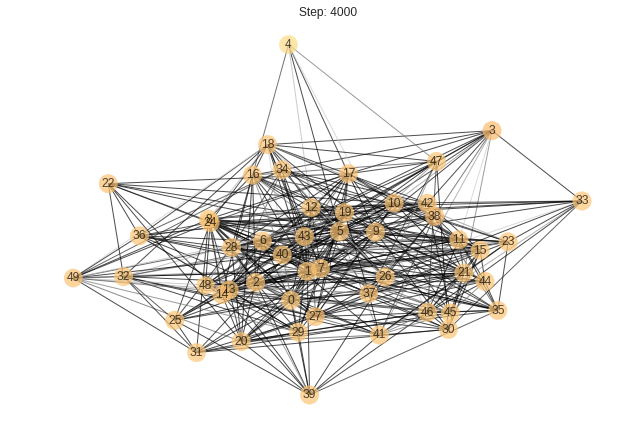

...

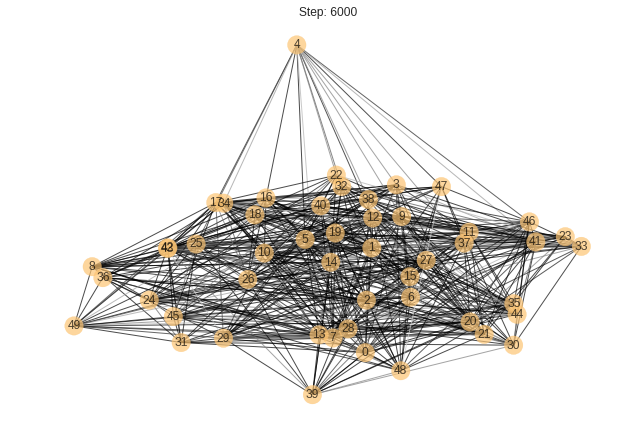

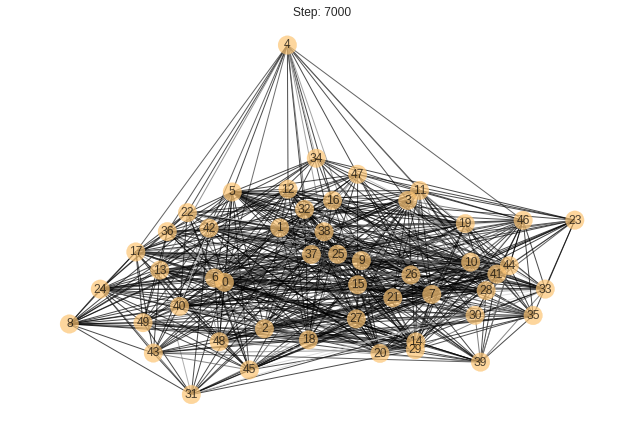

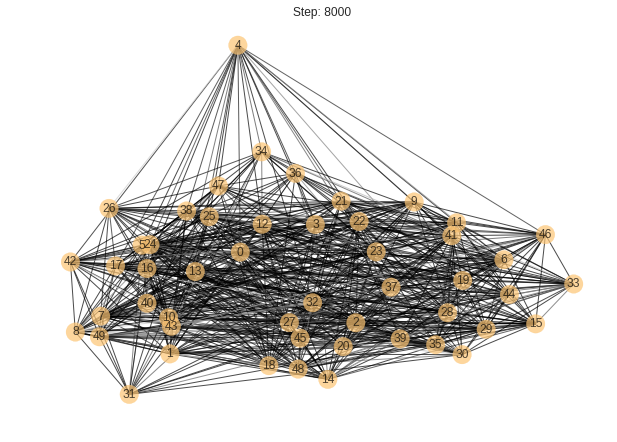

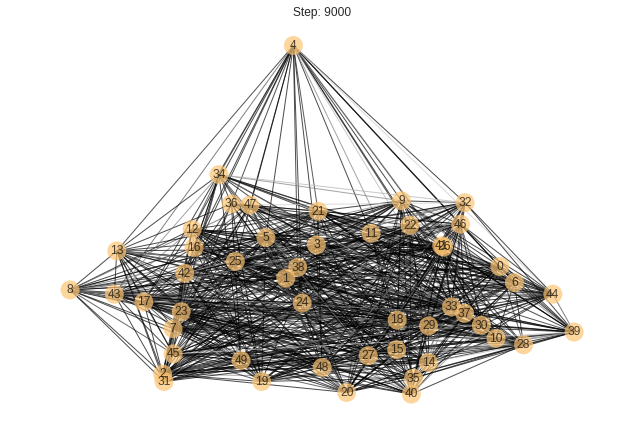

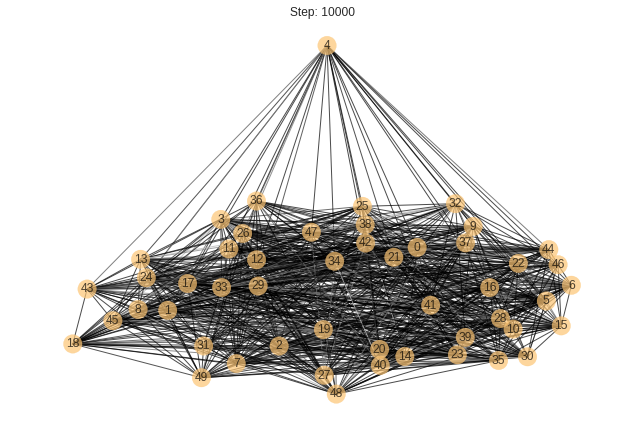

In [68]:
sim = SocialDynamicsSimulation_simulations(alpha_LB = 0.08,alpha_UB = 0.3, beta_LB = 0.5,beta_UB = 0.8,gamma_LB = 2.25,gamma_UB = 3)
sim.initialize()
plt.figure()
sim.observe()
for i in range(10):
    for i in range(1000):
        sim.update()
    plt.figure()
    sim.observe()

## Simulation Using Large Parameter Values 

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


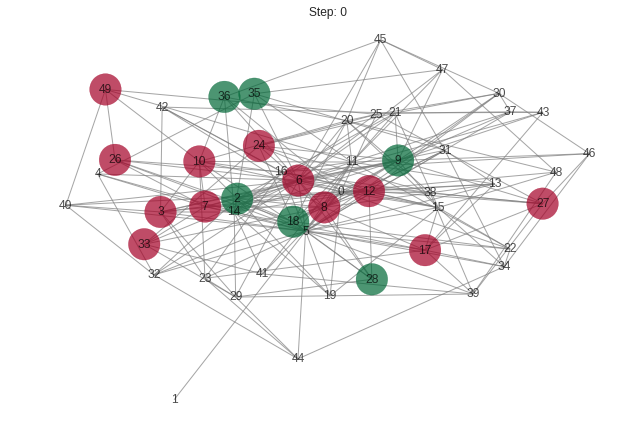

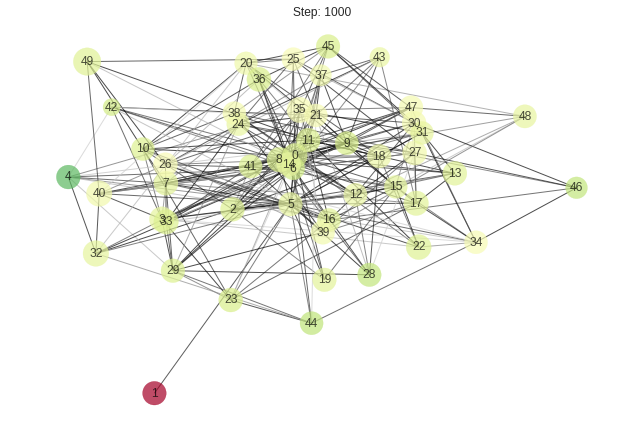

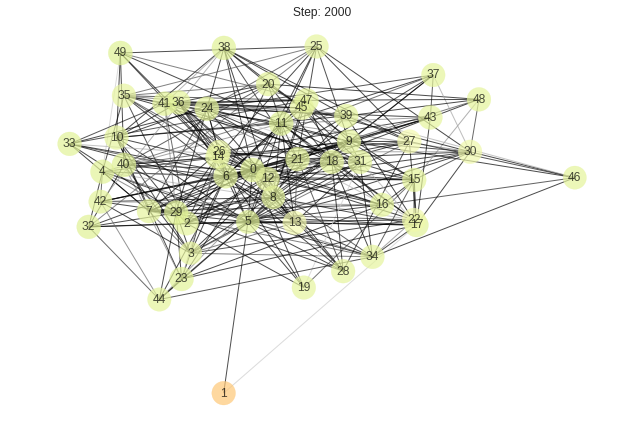

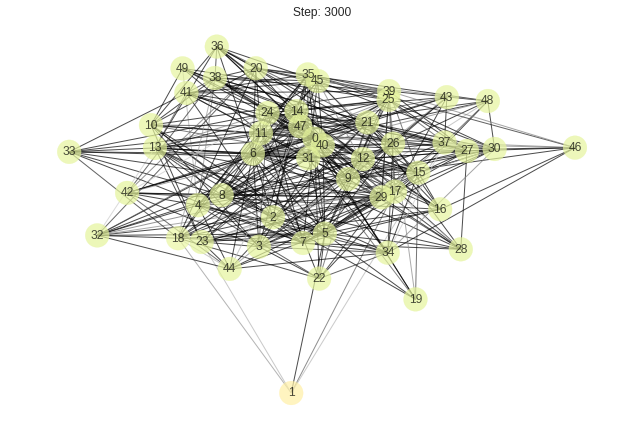

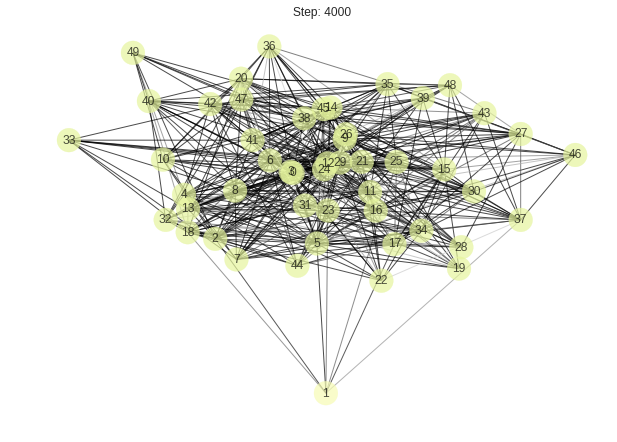

...

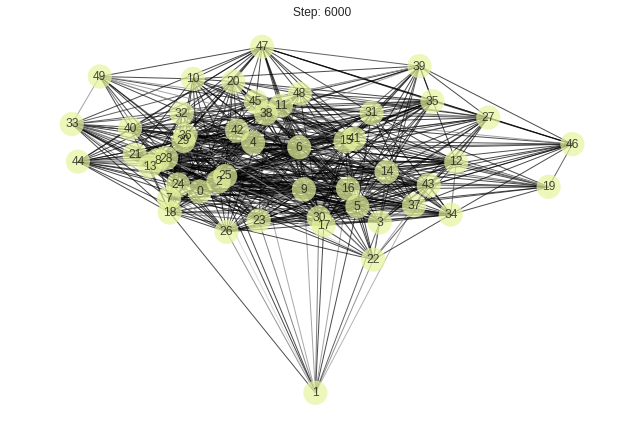

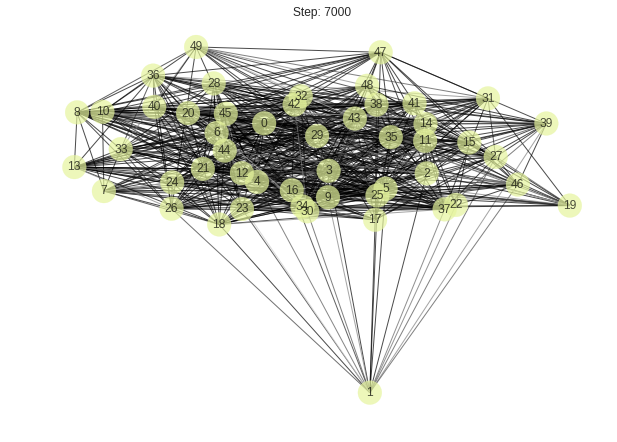

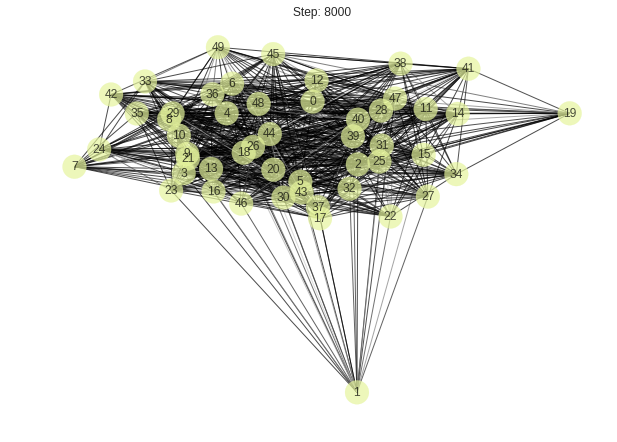

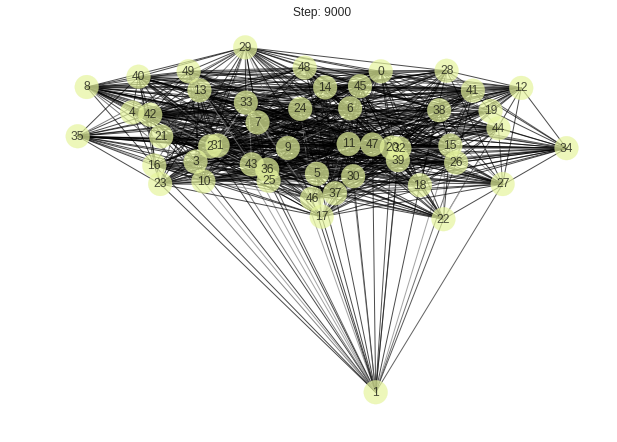

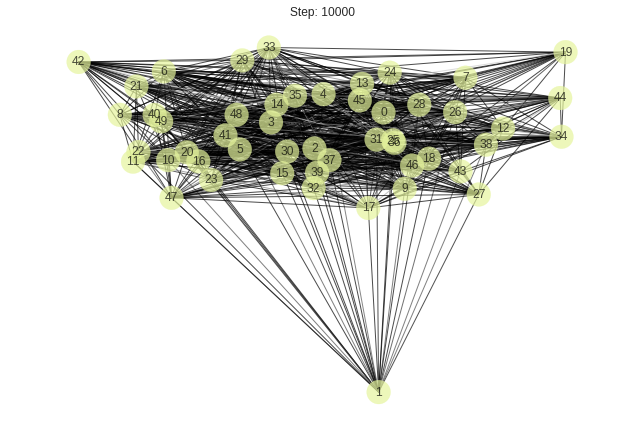

In [69]:
sim = SocialDynamicsSimulation_simulations(alpha_LB = 0.3,alpha_UB = 0.3, beta_LB = 0.8,beta_UB = 0.8,gamma_LB = 2.25,gamma_UB = 2.25)
sim.initialize()
plt.figure()
sim.observe()
for i in range(10):
    for i in range(1000):
        sim.update()
    plt.figure()
    sim.observe()